# Copyright

<PRE>
Jelen Jupyter notebook a Budapesti Műszaki és Gazdaságtudományi Egyetemen tartott "Deep Learning a gyakorlatban Python és LUA alapon" tantárgy segédanyagaként készült. 
A tantárgy honlapja: http://smartlab.tmit.bme.hu/oktatas-deep-learning
Deep Learning kutatás: http://smartlab.tmit.bme.hu/deep-learning

A notebook bármely részének újra felhasználása, publikálása csak a szerzők írásos beleegyezése esetén megengedett.

2020 (c) Gyires-Tóth Bálint (toth.b kukac tmit pont bme pont hu), Kalapos András
</PRE>

## Loggerek, "kísérletkövetők"
Neuronhálók tanítása során fontos, hogy a tanulásunk előrehaladását menet közben lássuk, vizualizáljuk. Erre eszközök: loggerek, kísérletkövetők


*   Tensorboard 
*   [Weights & Biases](https://docs.wandb.ai/quickstart)
*   [CometML](https://www.comet.ml/site/data-scientists/)
*   [Neptune](https://neptune.ai/)
* ...




## TensorBoard alapok

Neuronhálók tanítása során sokat használunk TensorBoard-ot, amin különböző paramétereit tudjuk folyamatosan monitorozni a tanításnak és a predikcióknak. Többek között a TensorBoard az alábbi menüpontokat kínálja: 
* scalars
* images
* audio
* debugger
* graphs
* distributions
* histograms
* text
* PR curves
* profile
* beholder
* hparams
* mesh
* projector
* what-if tool

Ezek közül néhányat megvizsgálunk, melyek használatára sokszor szükség lehet.

2 fontos komponens:


*   Naplózó (summary writer)
    - Kódba importálva naplózhatók különböző eredmények
    - events.out.... file írása
    - Több alternatíva
      -  "eredeti" - `tensorflow.summary.SummaryWriter`
      -  "független" - `tensorboardX.SummaryWriter`
*   Tensorboard vizualizáló
    - Külön kell elindítani
    - Colab-ben:
    ```
    %load_ext tensorboard
    %tensorboard --logdir logs
    ```



### Setup

In [1]:
! pip install tensorboardX

     |████████████████████████████████| 124 kB 27.3 MB/s 


In [2]:
from tensorboardX import SummaryWriter
logdir = "logs"
writer = SummaryWriter(logdir, flush_secs=1)

In [3]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

### Scalars
Gyakran használt funkció, jellemzően neurális hálózatok tanítása során különböző értékeket mentünk el. Most egyelőre neurális hálózattól függetlenül mentsünk el egy növekvő számsort és jelenítsük meg TensorBoard-on: 

In [4]:
for i in range(100):
   writer.add_scalar('my variable', scalar_value=(i**2), global_step=i)

### Images
Sokszor szükség lehet képek megjelenítésére, erre szolgál az Images része a TensorBoard-nak. Töltsünk be egy képet az MNIST adatbázisból és mentsük ezt le TensorBoard alá:

In [5]:
import tensorflow as tf
mnist = tf.keras.datasets.mnist
(images,labels), (_,_) = mnist.load_data()

11501568/11490434 [==============================] - 0s 0us/step


In [6]:
print("Shape: ", images[0].shape)
print("Label: ", labels[0])

Shape:  (28, 28)
Label:  5


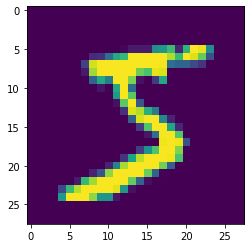

In [7]:
import matplotlib.pyplot as plt
plt.imshow(images[0])

In [8]:
  import numpy as np
  img = np.reshape(images[0], ( 1, 28, 28))
  writer.add_image("MNIST Image 0", img, global_step=0)

## Graphs
A neurális hálózatok számítási gráfját is ki lehet rajzolni. Egyelőre ezt nem csináljuk meg, de később hasznos információkat tartalmaz egy ilyen gráf. 

## HParams
A TensorBoard-ban lehetőség van a hiperparaméterek különféle megjelenítésére is. Erről még később sokat fogtok hallani, most elég annyit tudnotok, hogy ez a különböző beállításait tartalmazza a neurális hálózatnak, amely alapján különböző modellezési pontosságot tudnak elérni. Mentsünk le pár tetszőleges számot hiperparaméterként és pár tetszőleges értéket cél "metrikaként". 

In [9]:
hparam1_values = [1,10,50,100]
hparam2_values = [0.1, 0.5]
hparam3_values = ['option1', 'option2']

In [10]:
session_num=0
for p1 in hparam1_values:
  for p2 in hparam2_values:
    for p3 in hparam3_values:
      # Session code 
      hparams = {
          "hp1": p1,
          "hp2": p2,
          "hp3": p3,
      }
      metrics = {
          "accuracy": np.random.randint(10) + p2*p1
      }
      run_name = "run-%d" % session_num
      with SummaryWriter("logs/hparams") as w:
        w.add_hparams(hparams, metrics)

In [11]:
%tensorboard --logdir logs/hparams

<IPython.core.display.Javascript object>